In [1]:
%pylab nbagg
%matplotlib inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import statistics as stats
def remove_mean(x):
    z = stats.mean(x)
    n  = len(x)
    for i in range(n):
        x[i] = (x[i]-z)
    return x

In [3]:
f = open('AllStations_temperature_h_2019.dat','r')
lines = f.readlines()
f.close()

In [4]:
#code from internet to convert Matlab timestamps tp POSIX timestamps which python uses
import pandas as pd
from datetime import datetime

# Additional 366 because January 0, year 0000 
offset = datetime(1970, 1, 1).toordinal() #719529
pd.to_datetime(734139.5-offset, unit='D')

Timestamp('2011-01-02 12:00:00')

In [5]:
data = []
#This code splits each line of lines into a list of each entry and converts each
#non-'NaN' entry into a float
for i in range(len(lines)):
    t = lines[i]
    rows = t.splitlines()
    date = [row.split() for row in rows]
    date = date[0]
    #stops lines 1 and 2 from being converted to floats
    if i <= 1:
        data.append(date)
        continue
        
    for j in range(len(date)):
        if date[j]=='NaN':
            continue
        else:
            date[j]= float(date[j])
    data.append(date)

In [6]:
(data[0][37])

'236.6910'

In [7]:
temps_data_hr = []
stamps_hr = []
n= 0
#timestamp = date[0] - offset
#dt_object = pd.to_datetime(timestamp, unit='D')
for i in range(1 ,40):
    time = []
    temp = []
    n=0
    for j in range(2,len(data)):
        n=j
        temp.append(data[j][i])
        #dt_object = pd.to_datetime(data[j][0]- offset, unit='D')
        time.append(data[j][0])
    temps_data_hr.append(temp)
    stamps_hr.append(time)

In [8]:

for i in range (len(temps_data_hr)):
    temps = []
    times = []
    for j in range(len(temps_data_hr[i])):
        if temps_data_hr[i][j] =='NaN':
            continue
        temps.append(temps_data_hr[i][j])
        times.append(stamps_hr[i][j])
    temps_data_hr[i] = temps
    stamps_hr[i] = times

C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, "('Station', 16)")

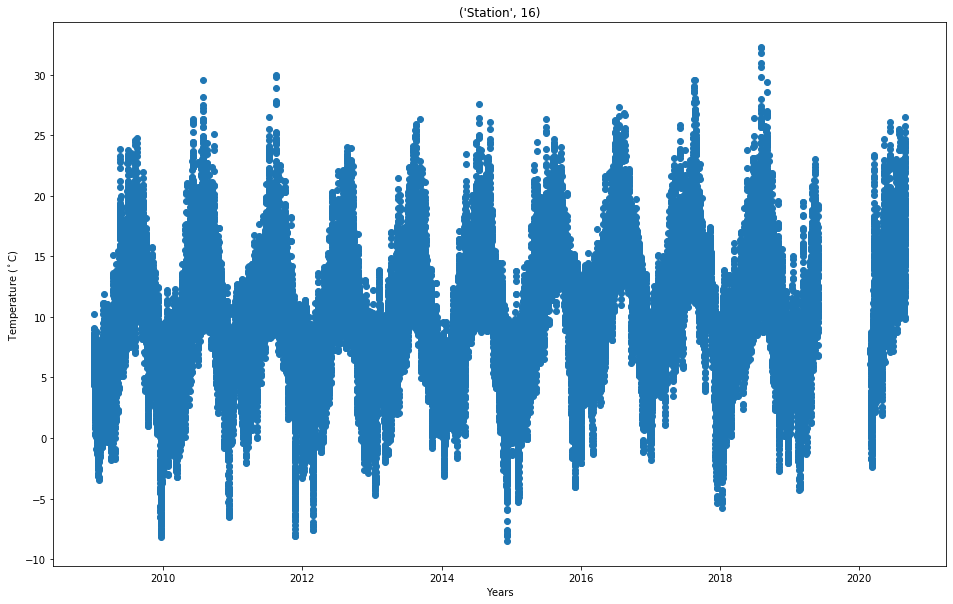

In [8]:
n=16
#times = matplotlib.dates.date2num(stamps_hr[n])
plt.figure(figsize=(16,10))
plt.plot_date(stamps_hr[n], temps_data_hr[n])

plt.xlabel("Years")
plt.ylabel("Temperature ($^\circ$C)")
plt.title(("Station" ,n))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


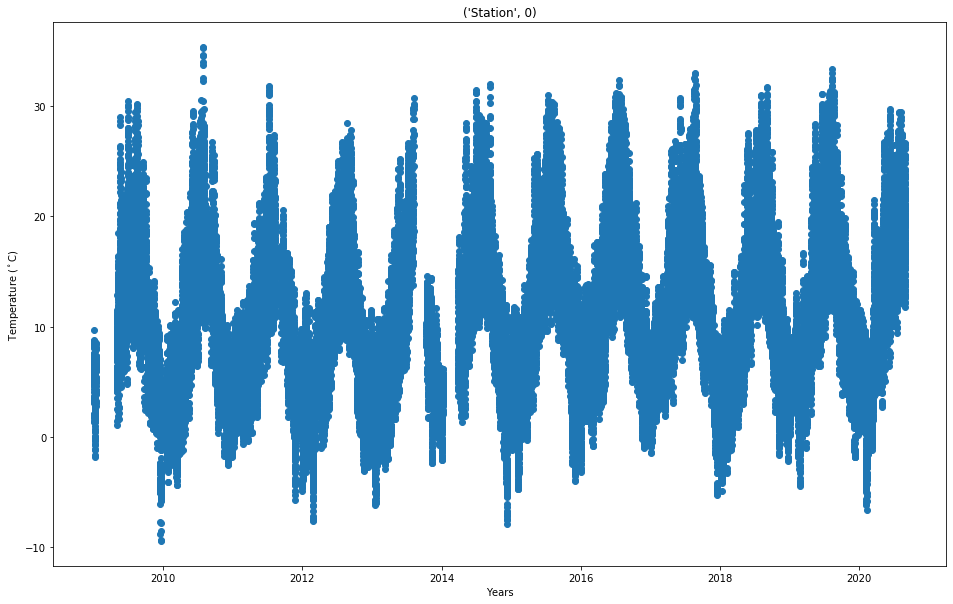

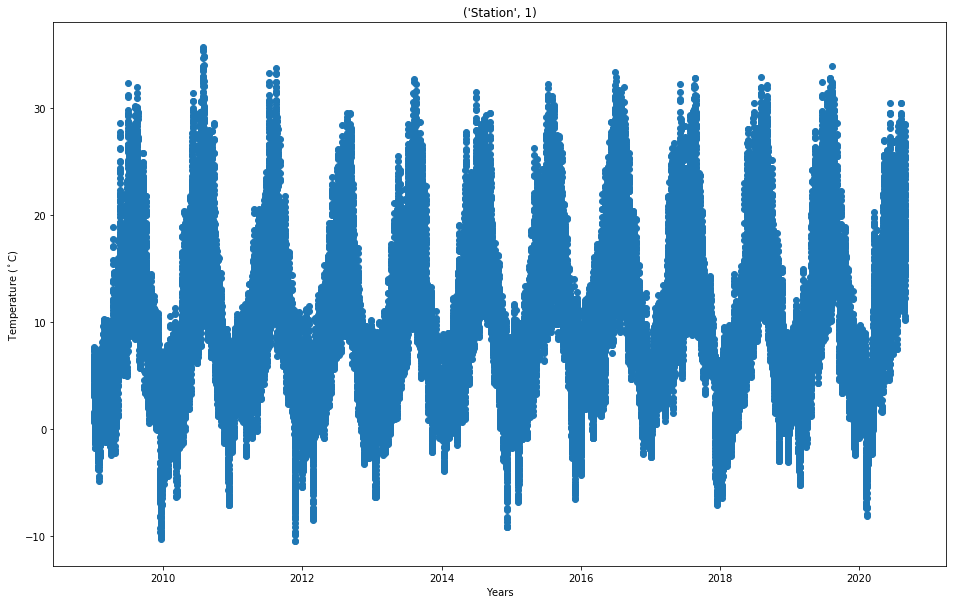

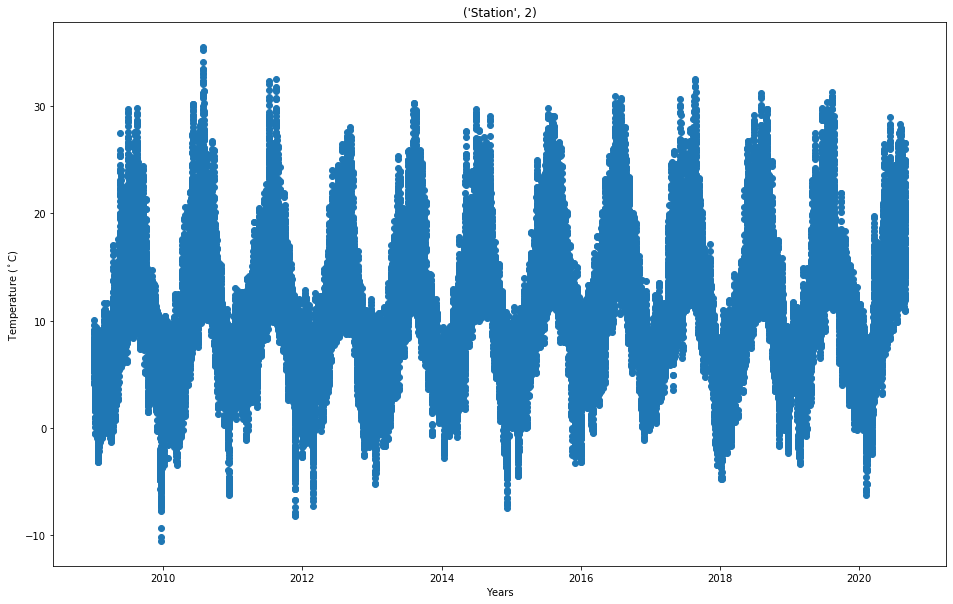

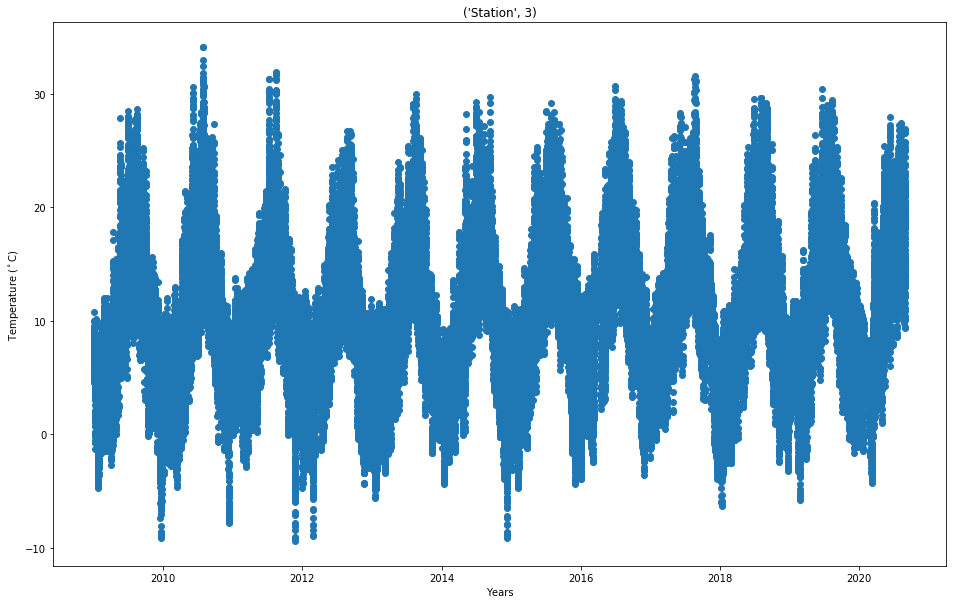

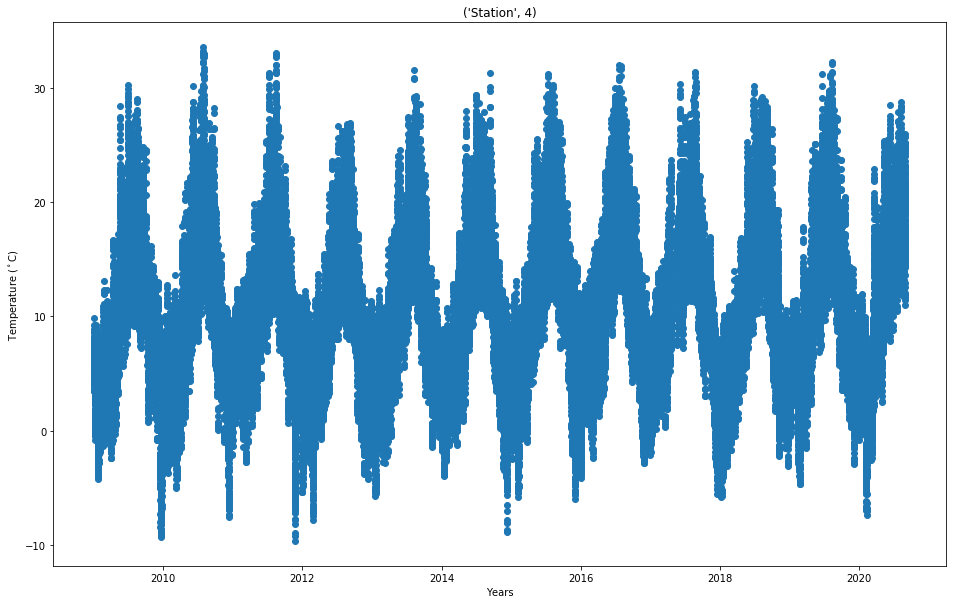

...

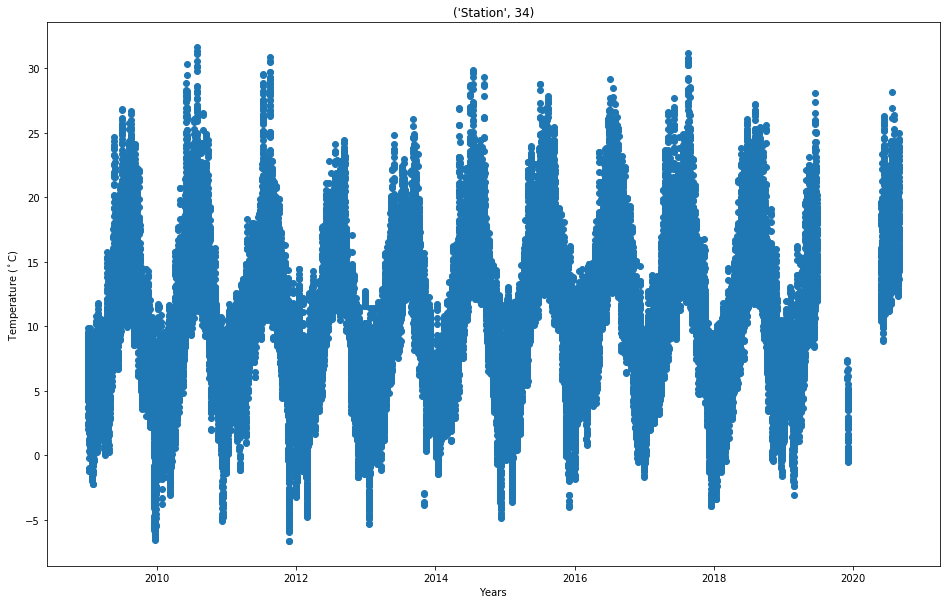

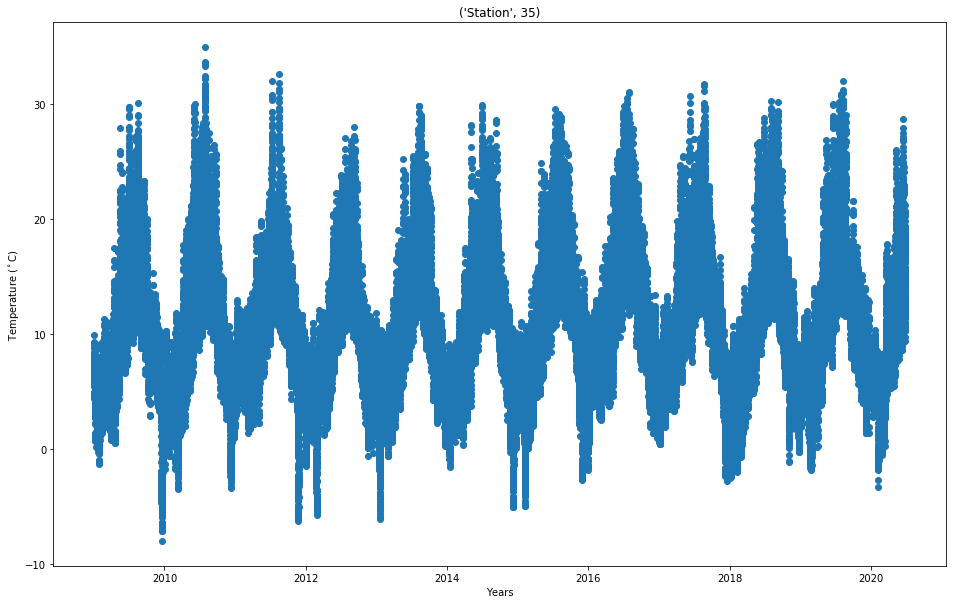

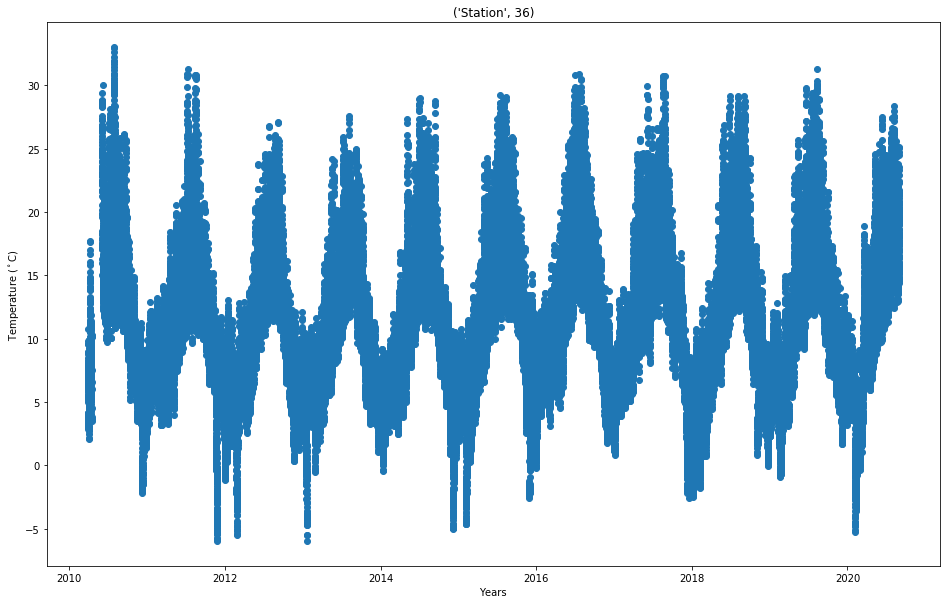

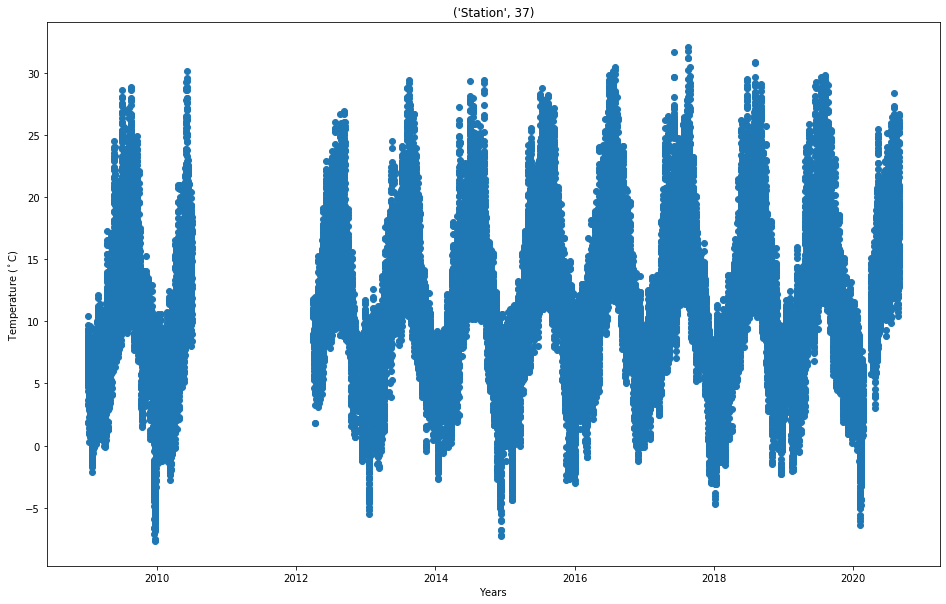

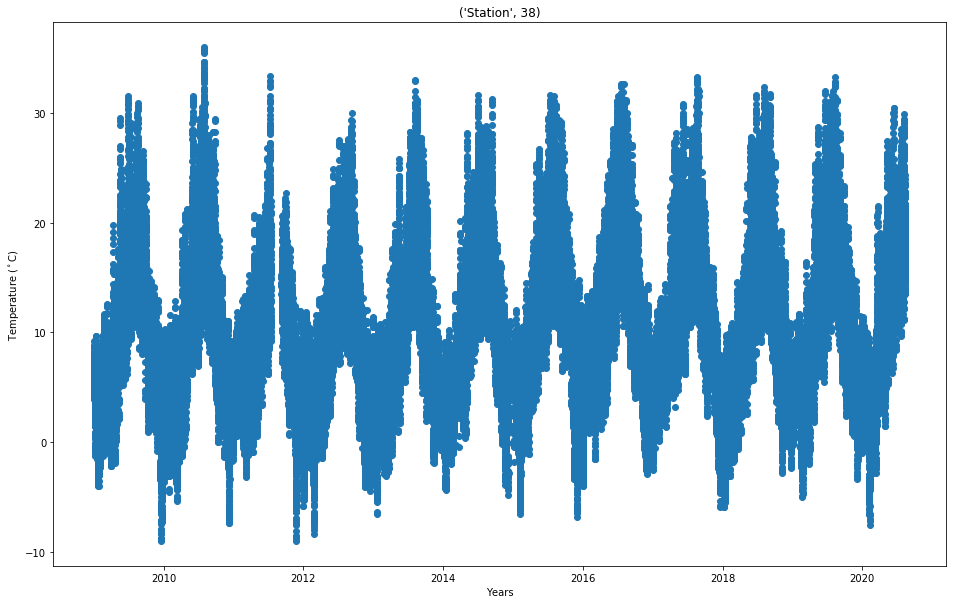

In [94]:
for i in range(len(temps_data_hr)):
   # times = matplotlib.dates.date2num(stamps_hr[i])
    plt.figure(figsize=(16,10))
    plt.plot_date(stamps_hr[i], temps_data_hr[i])

    plt.xlabel("Years")
    plt.ylabel("Temperature ($^\circ$C)")
    plt.title(("Station", i))

In [28]:
f = open('Coast.dat','r')
coast = f.readlines()
f.close()

In [29]:
data2 = []
#This code splits each line of lines into a list of each entry and converts each
#non-'NaN' entry into a float
for i in range(len(coast)):
    t = coast[i]
    rows = t.splitlines()
    date = [row.split() for row in rows]
    date = date[0]
    #stops lines 1 and 2 from being converted to floats
    if i <= 1:
        data.append(date)
        continue
        
    for j in range(len(date)):
        if date[j]=='NaN':
            continue
        else:
            date[j]= float(date[j])
    data2.append(date)

In [30]:
type(data2)

list

In [31]:
longitude = []
latitude = []
for i in range(len(data2)):
    longitude.append(float(data2[i][0]))
    latitude.append(float(data2[i][1]))

In [32]:
stations = []
st_long= []
st_lat = []
for i in range(1,len(data[0])):
    st_long.append(float(data[0][i])-360)
    st_lat.append(float(data[1][i]))
stations = [st_long,st_lat]

In [33]:
len(stations[0])

39

In [37]:
n = []
for i in range(39):
    n.append(i)

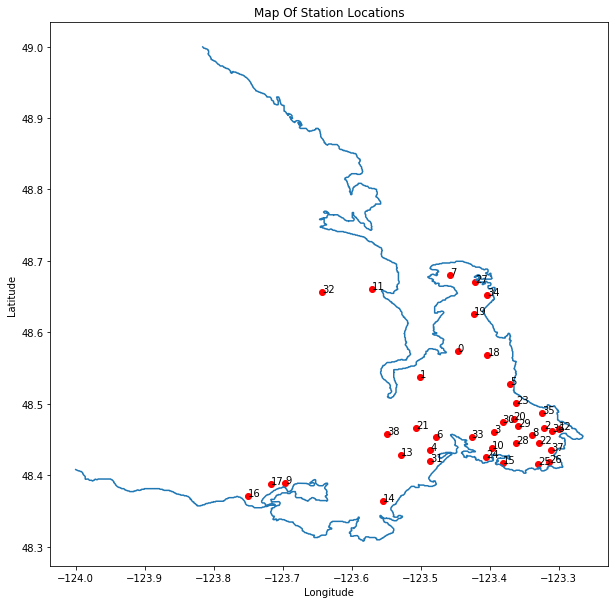

In [40]:
plt.figure(figsize=(10,10))
plt.plot(longitude,latitude)
plt.scatter(stations[0],stations[1],color ='r')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title('Map Of Station Locations')
for i, txt in enumerate(n):
    plt.annotate(txt, (stations[0][i], stations[1][i]))

Text(0.5, 1.0, 'Map Of Station Locations')

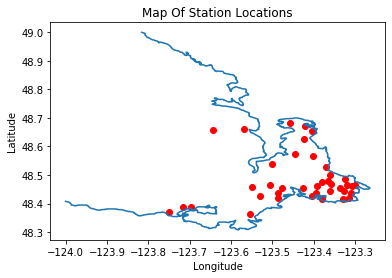

In [34]:
plt.plot(longitude,latitude)
plt.scatter(stations[0],stations[1],color ='r')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title('Map Of Station Locations')

In [73]:
#This code finds all data within a given time span 

def relavent_dates(date, temp, start, end):

    #Contains the relavent dates and assoiciated temperatures
    rev_dates = []
    rev_temps = []
    #skips indexs 0 and 1 beacause those ones only contain longitudes and latitudes of stations
    for i in range(len(date)):

        #Convert to datetime objects to compare dates
        year = int(date[i].year)
        month = int(date[i].month)
        day = int(date[i].day)
        #will skip all dates less than dt_start
        if year >= int(start.year) and year <= int(end.year):
            if year == int(start.year):
                if month <= int(start.month):
                    if day < int(start.day) or month < int(start.month):
                        continue
            
            #skips dates greater than dt_end
            if year == int(end.year):
                if month >= int(end.month):
                    if day >int(end.day)or month > int(end.month):
                        continue
            #Add relavent dates to rev_dates
            rev_temps.append(temp[i])
            rev_dates.append(date[i])
    return rev_dates,rev_temps


In [10]:
#dates_1 = matplotlib.dates.date2num(jbay_time_sum)


def retrieve_relavent_data3(start,end,temps_min,stamps):
    #value to increment timestaps by
    dates = []
    temps = []
    temp_end = datetime.fromtimestamp(end)
    stamp_end = matplotlib.dates.date2num(temp_end)
    temp_start = datetime.fromtimestamp(start)
    stamp_start = matplotlib.dates.date2num(temp_start)
    for i in range(1,len(stamps)):
        
        
        if stamps[i] >= stamp_start and stamps[i] <= stamp_end:
            #Add relavent dates and index associate temperatures
            temps.append(temps_min[i])
            dates.append(stamps[i])
        else:
            continue
    return dates,temps
    

In [10]:
data = [stamps_hr,temps_data_hr]

In [97]:
data[0][3][0]

733408.0

In [11]:
pd.to_datetime(734139.5-offset, unit='D')
date_time_str = '2013-01-01 00:00:00.00000'
date_start = datetime.strptime(date_time_str, '%Y-%m-%d %H:%M:%S.%f')
print(date_start)
date_time_str = '2014-01-01 00:00:00.000000'
date_end = datetime.strptime(date_time_str, '%Y-%m-%d %H:%M:%S.%f')
print(date_end)

sum_stamp_start = datetime.timestamp(date_start)


sum_stamp_end = datetime.timestamp(date_end)


2013-01-01 00:00:00
2014-01-01 00:00:00


date_time_str = '2016-01-01 00:00:00.00000'
date_start = datetime.strptime(date_time_str, '%Y-%m-%d %H:%M:%S.%f')
date_time_str = '2018-10-01 00:00:00.000000'
date_end = datetime.strptime(date_time_str, '%Y-%m-%d %H:%M:%S.%f')
summer_dates_yearly.append([datetime.timestamp(date_start),datetime.timestamp(date_end)])


In [12]:
stations_data = []
#get temperatures from stations within date interval
for i in range(len(stamps_hr)):
    a,b = retrieve_relavent_data3(datetime.timestamp(date_start),datetime.timestamp(date_end)
                                  ,temps_data_hr[i].copy(),stamps_hr[i].copy())
    b = remove_mean(b.copy())
    stations_data.append([a,b])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


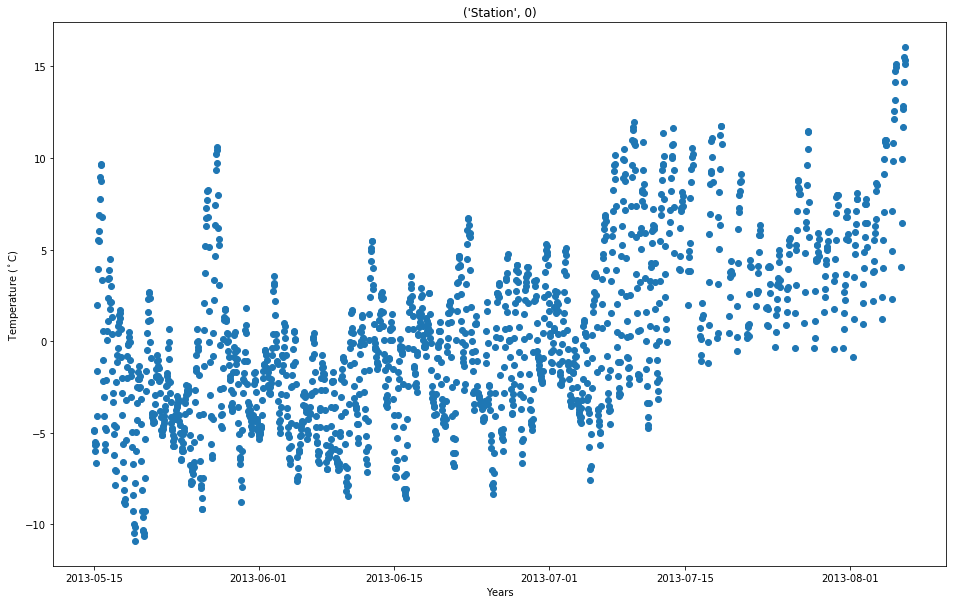

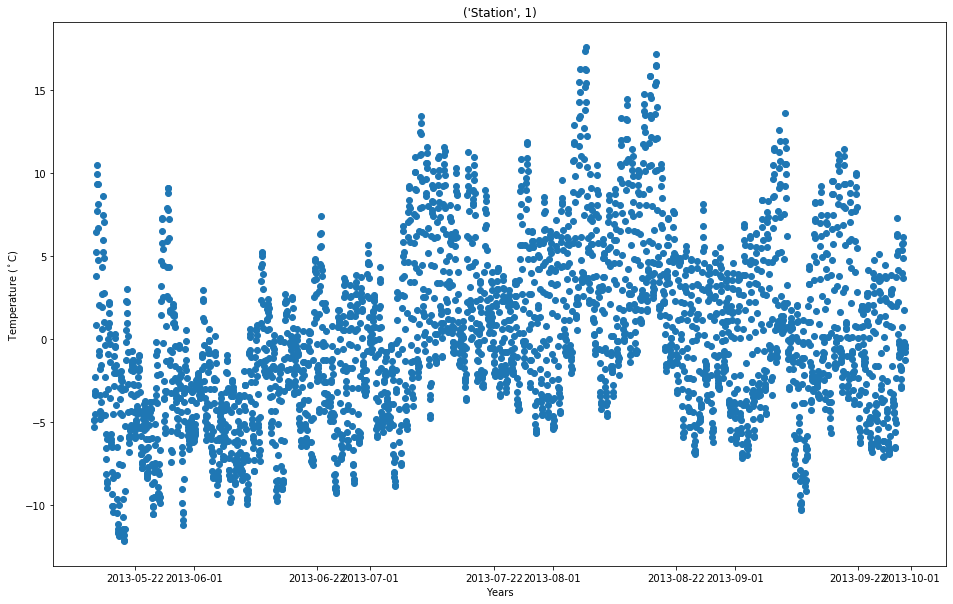

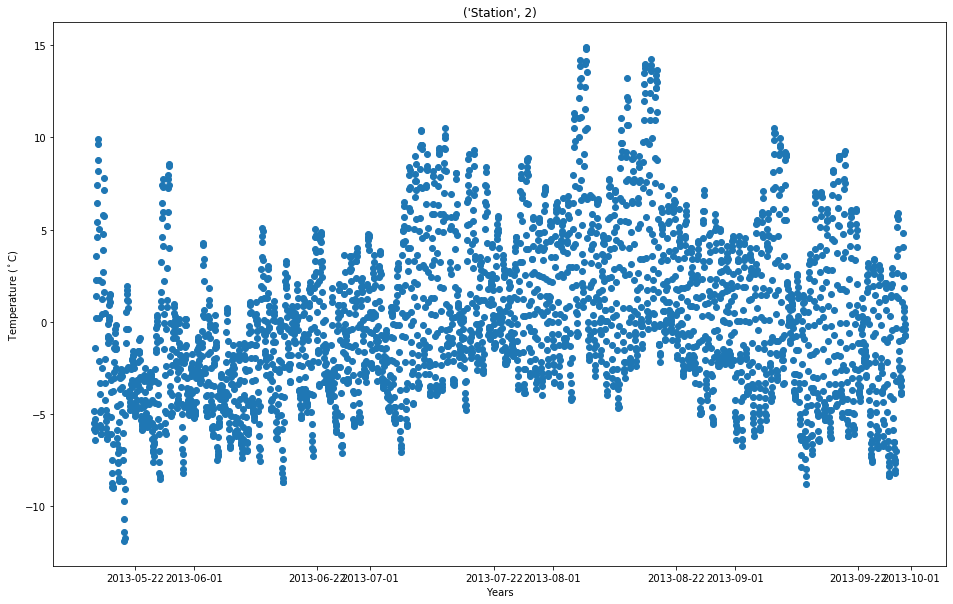

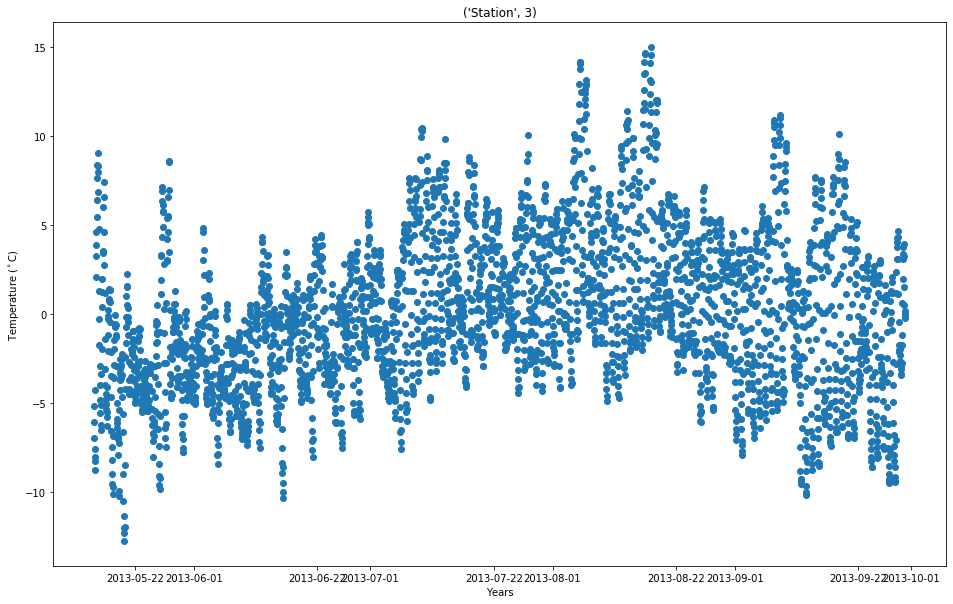

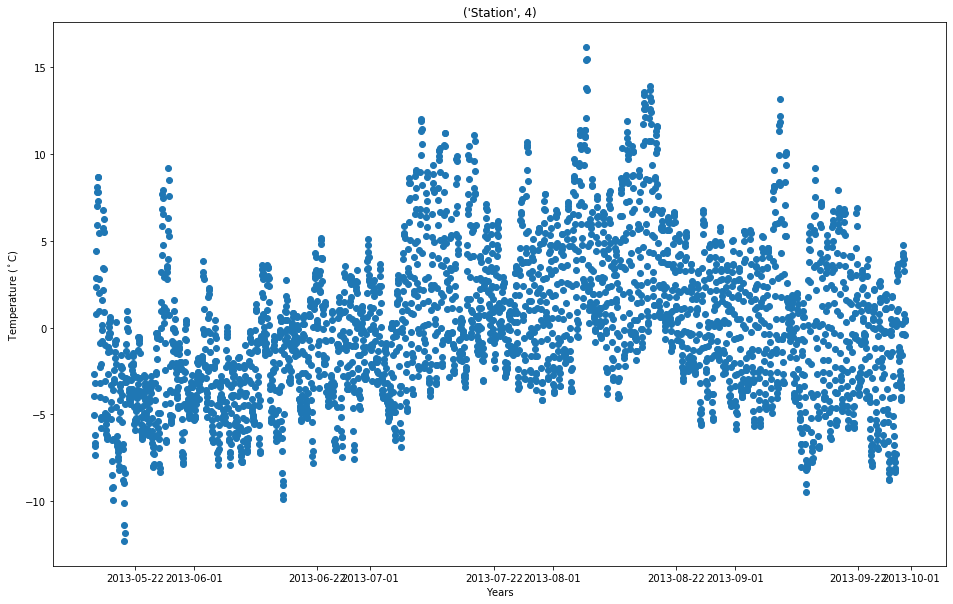

...

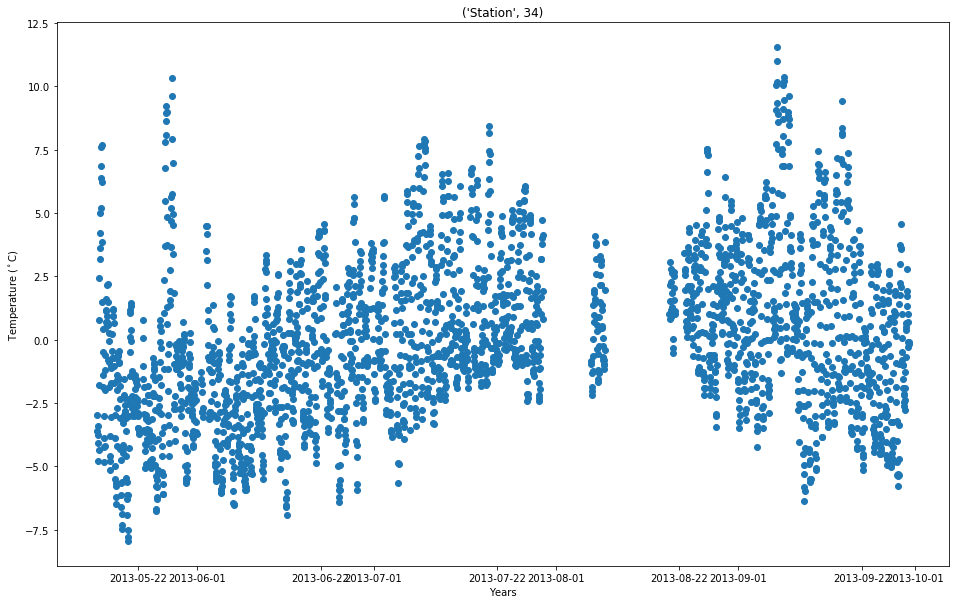

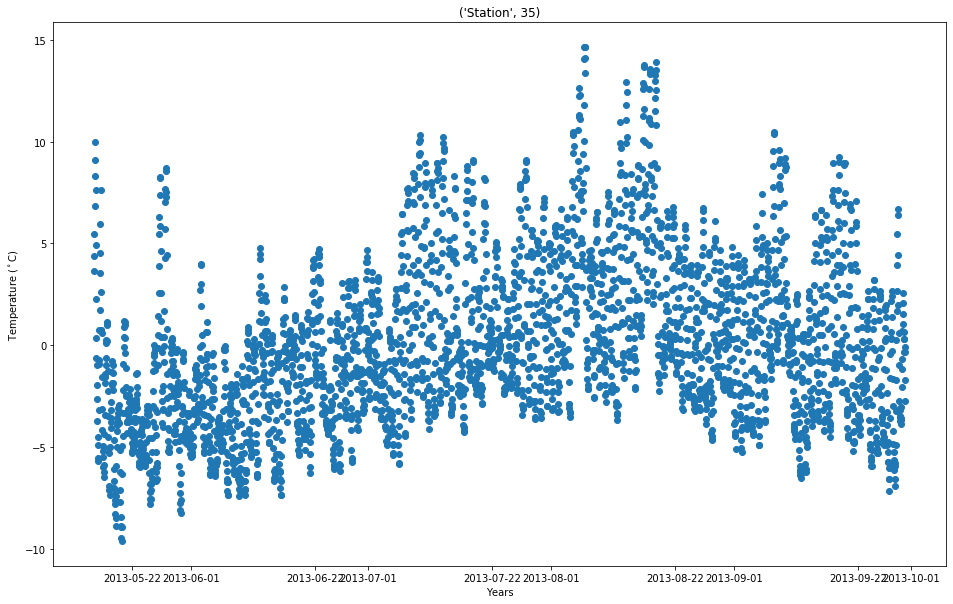

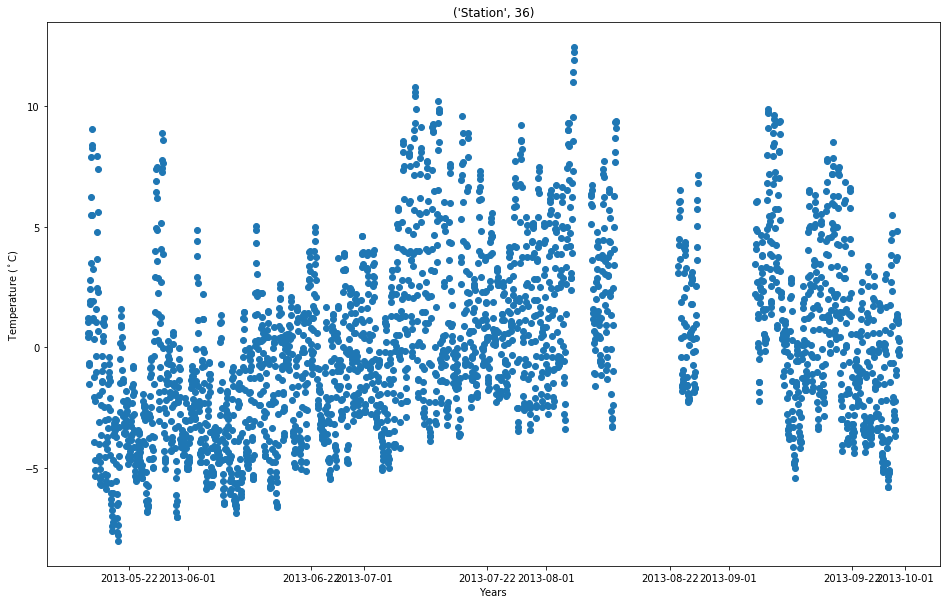

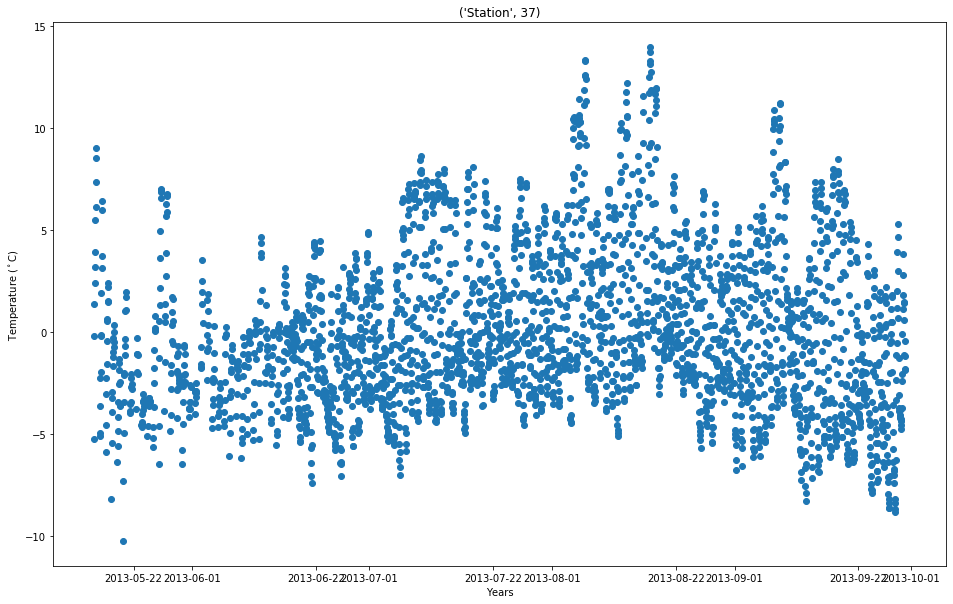

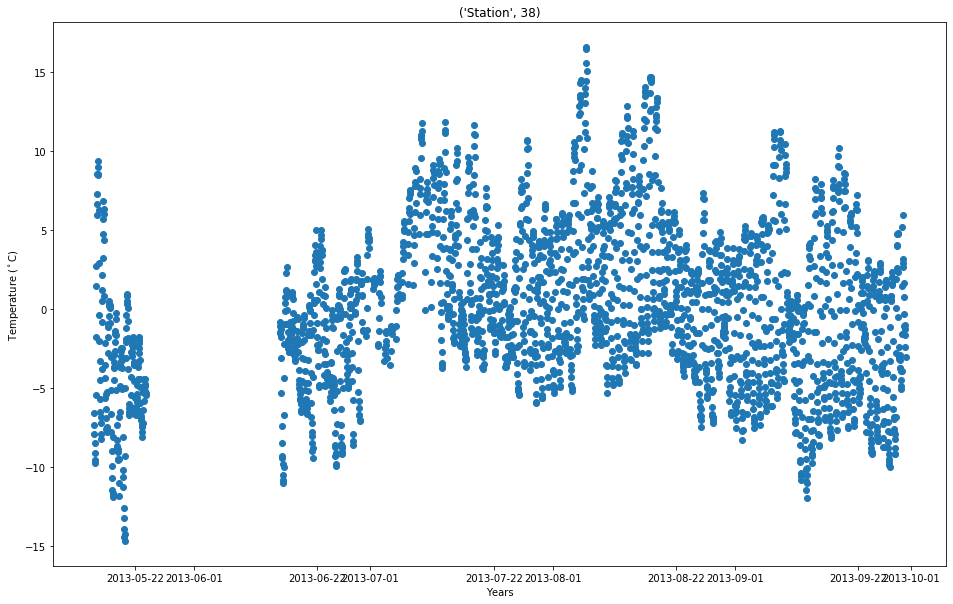

In [48]:
for i in range(len(temps_data_hr)):
   # times = matplotlib.dates.date2num(stamps_hr[i])
    plt.figure(figsize=(16,10))
    plt.plot_date(stations_data[i][0], stations_data[i][1])

    plt.xlabel("Years")
    plt.ylabel("Temperature ($^\circ$C)")
    plt.title(("Station", i))
    


In [49]:
plt.close('all')

In [102]:
data[0][0][1]-data[0][0][2]

-0.041600000113248825

In [13]:
itr = 10
for j in range(itr):
    for i in range(39):
        n = len(stations_data[i][0])
        for k in range(0, n-1):
            st1 = stations_data[i][0][k]
            st2 = stations_data[i][0][k+1]
            dif = abs(int(st2 - st1))
            #3600 is timestamp difference for 1 hour
            if dif > 0.0420:
                stations_data[i][1].insert(k+1,0)
                time_stamp = stations_data[i][0][k]+0.0416
                #time_date = datetime.fromtimestamp(time_stamp)
                stations_data[i][0].insert(k+1,time_stamp)
                n = n +1
                k = k-1


In [14]:
for i in range(len(stations_data)):
    p = len(stations_data[i][1])
    #p = stations_data[i][0][-1]
    print(p)

8434
8702
8738
8760
8760
8756
8760
8723
8672
8177
8713
8749
8675
8756
8706
8692
8692
8737
8755
8735
8760
8583
8345
8760
8750
8713
8670
7962
8574
8104
8645
8382
8753
8600
8292
8657
8694
7839
8564


In [14]:
for i in range(39):
    time_stamp = stations_data[i][0][-1]
    while len(stations_data[i][1]) < 8760:
        
        stations_data[i][1].append(0)
        time_stamp = time_stamp + 0.0416
        #time_date = datetime.fromtimestamp(time_stamp)
        stations_data[i][0].append(time_stamp)


In [16]:
for i in range(39):
    print(len(stations_data[i][1]))

8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760


C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, "('Station', 7)")

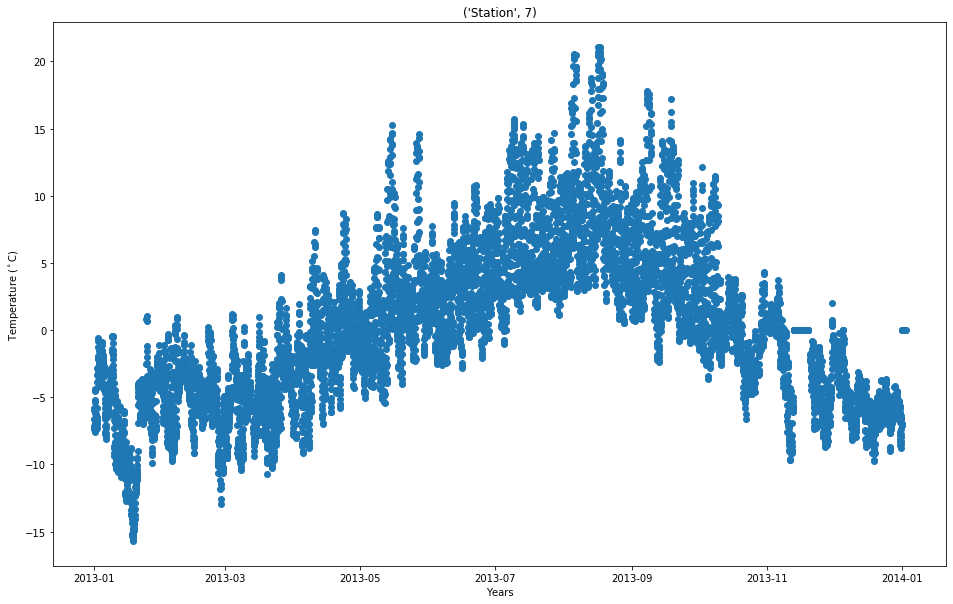

In [15]:
n=7
#times = matplotlib.dates.date2num(stations_data[n][0])
plt.figure(figsize=(16,10))
plt.plot_date(stations_data[n][0], stations_data[n][1])

plt.xlabel("Years")
plt.ylabel("Temperature ($^\circ$C)")
plt.title(("Station", n))

stations_data[0][0].append(stations_data[0][0][-1]+0.0416)

In [140]:
plt.close('all')

In [528]:
times[2]

735964.0833

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


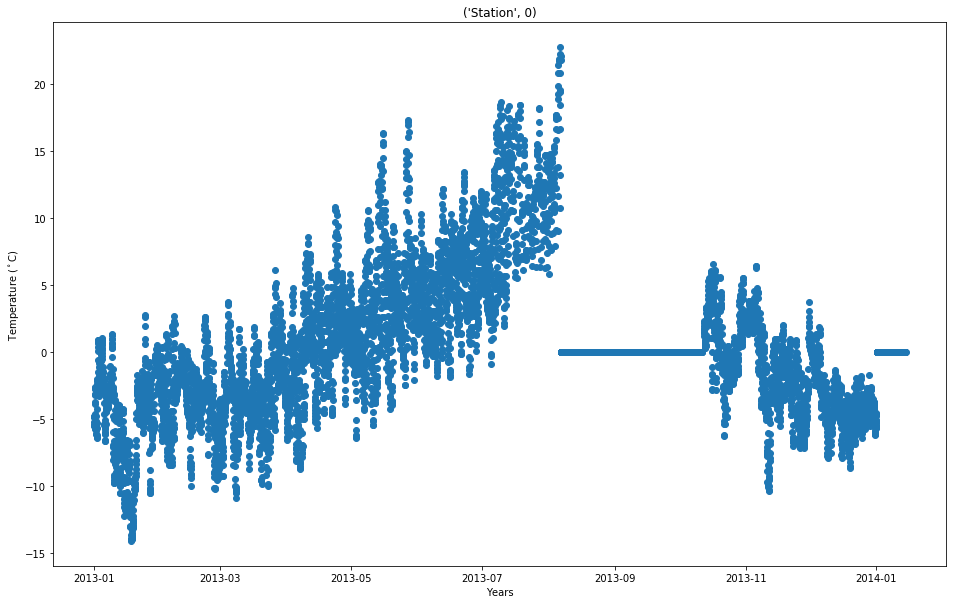

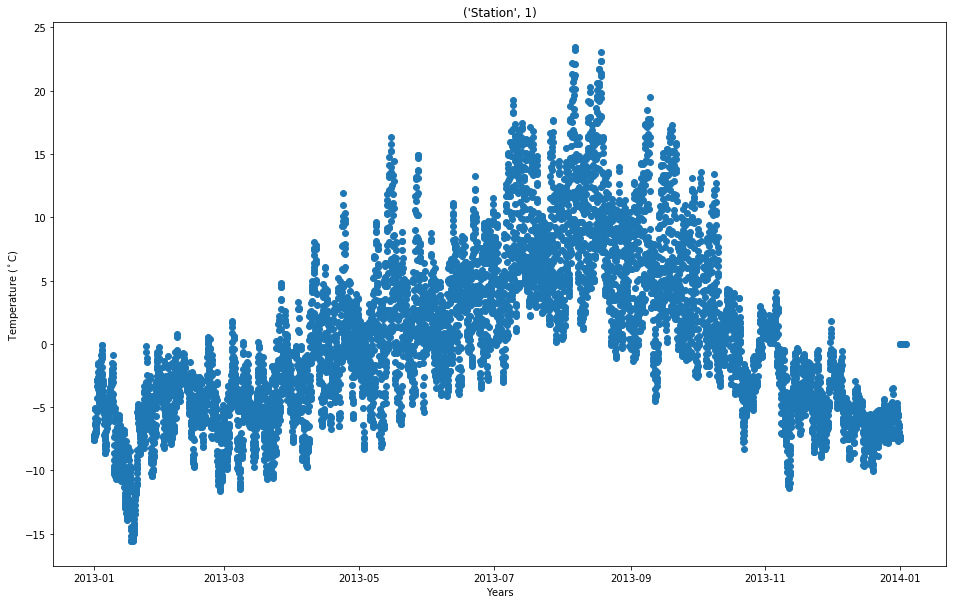

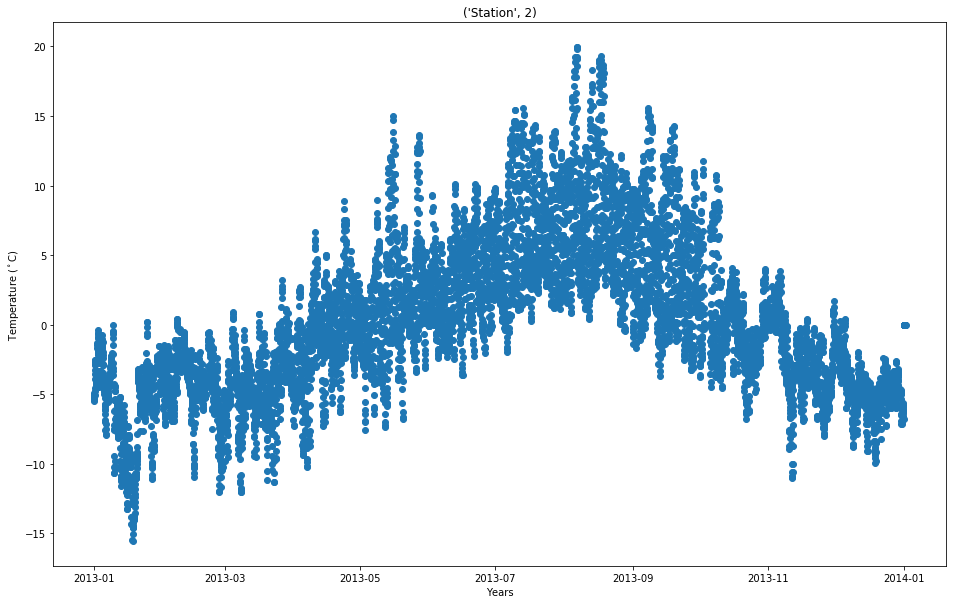

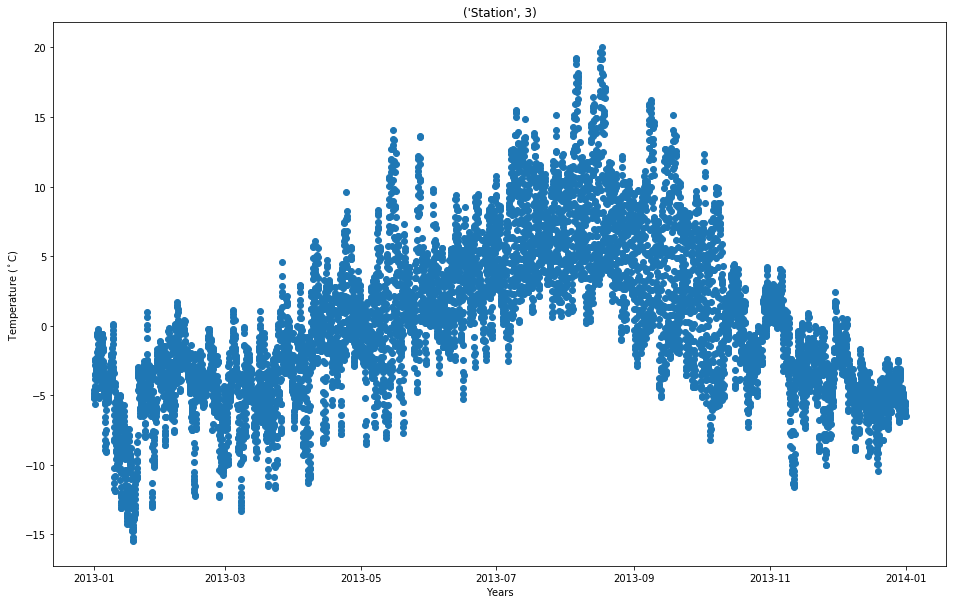

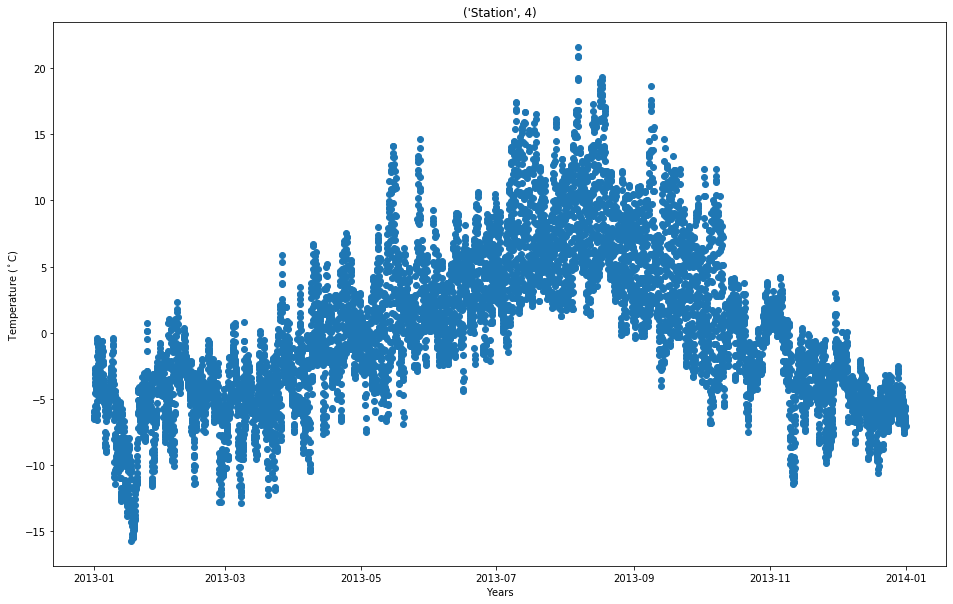

...

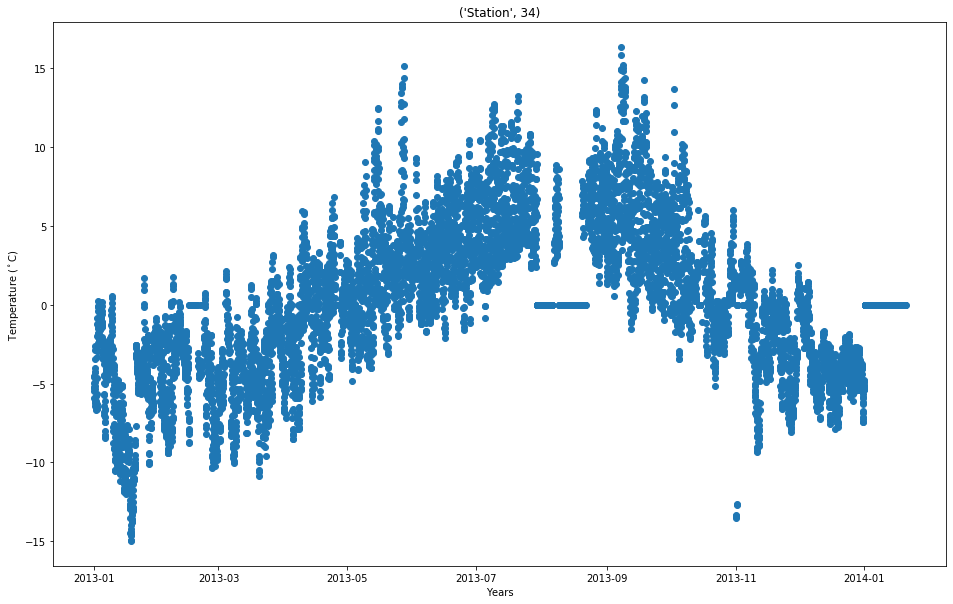

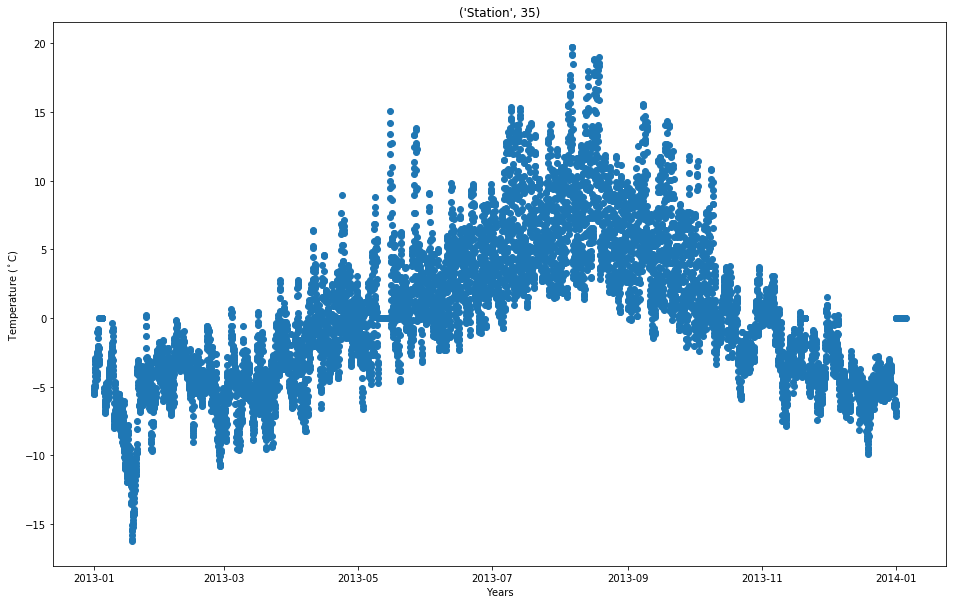

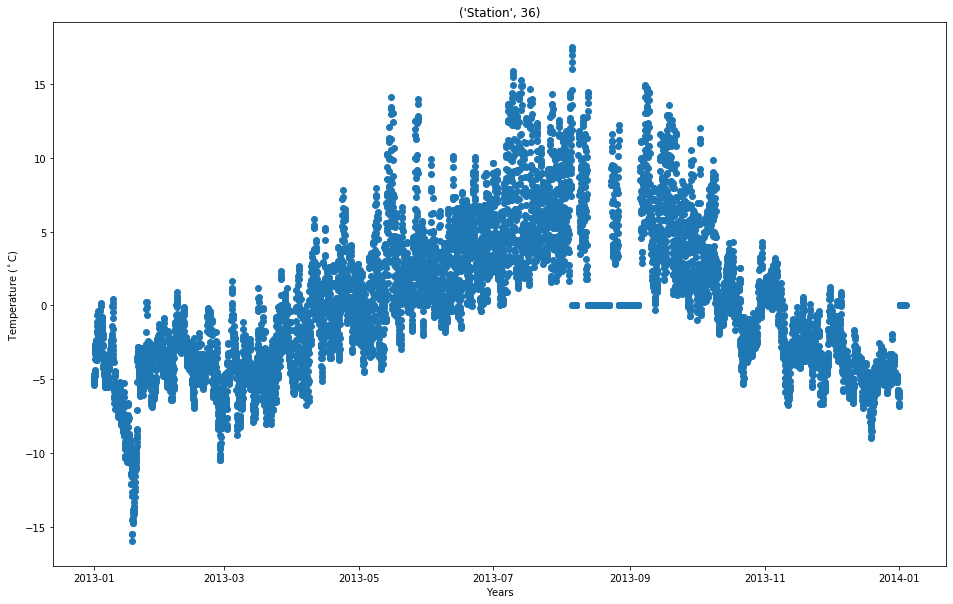

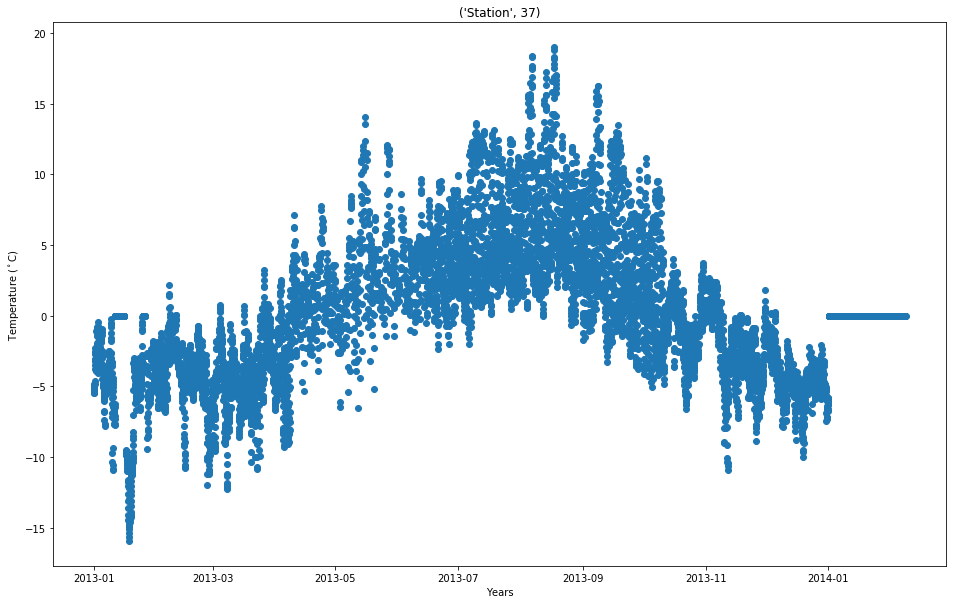

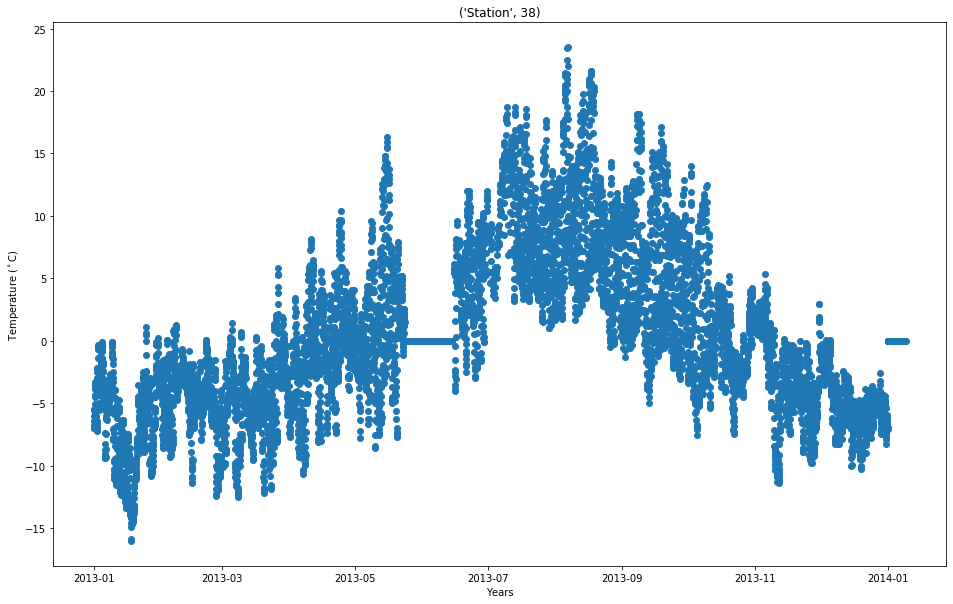

In [42]:
plt.close('all')
for i in range(len(stations_data)):
    #times = matplotlib.dates.date2num(stations_data[i][0])
    plt.figure(figsize=(16,10))
    plt.plot_date(stations_data[i][0], stations_data[i][1])

    plt.xlabel("Years")
    plt.ylabel("Temperature ($^\circ$C)")
    plt.title(("Station", i))


In [56]:
plt.close('all')

In [16]:
stations_temp = []
for i in range(len(stations_data)):
    stations_temp.append(stations_data[i][1])

In [21]:
type(stations_temp[0])

list

In [17]:
for i in range(len(stations_data)):
    p = len(stations_data[i][0])
    #p = stations_data[i][0][-1]
    print(p)

8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760
8760


In [18]:
stations_temp_transpose = np.transpose(stations_temp)

In [122]:
stations_data_Transpose = np.transpose(stations_data)

In [24]:
len(stations_temp_transpose[0])

39

In [19]:
C = np.cov(stations_temp)

In [20]:
len(C[0])

39

In [41]:
C

array([[24.34806676, 15.61114833, 16.23911567, ..., 15.69384757,
        13.74089309, 18.99167795],
       [15.61114833, 41.3307178 , 27.73472303, ..., 23.21730599,
        14.14252603, 25.89421453],
       [16.23911567, 27.73472303, 30.58065109, ..., 22.10827627,
        14.12176617, 27.58973556],
       ...,
       [15.69384757, 23.21730599, 22.10827627, ..., 23.44428925,
        12.99482302, 21.7291493 ],
       [13.74089309, 14.14252603, 14.12176617, ..., 12.99482302,
        24.53650856, 18.27033321],
       [18.99167795, 25.89421453, 27.58973556, ..., 21.7291493 ,
        18.27033321, 39.65980302]])

In [20]:
import scipy.linalg as la
results = la.eig(C)

In [42]:
len(results[0])

39

In [41]:
results[1]

array([[-0.11710532,  0.06493015, -0.16948344, ..., -0.01805255,
        -0.00883099,  0.0032317 ],
       [-0.18599186,  0.08150905,  0.3315263 , ..., -0.05973178,
         0.00666211, -0.11868697],
       [-0.17768918, -0.19343289,  0.06828236, ..., -0.03647637,
        -0.10834514, -0.3507982 ],
       ...,
       [-0.14232373, -0.01215411,  0.12412747, ...,  0.08169005,
         0.04571624, -0.00812946],
       [-0.10583477,  0.15150206, -0.10981527, ..., -0.02806784,
         0.00683714, -0.02254433],
       [-0.18832052, -0.02527699, -0.21914566, ..., -0.01132071,
        -0.02485029, -0.01155314]])

In [21]:
results_dom_modes = []
for i in range(len(results[1])):
    modes = []
    for j in range(4):
        modes.append((results[1][i][j]))
    results_dom_modes.append(modes)

In [47]:
results_dom_modes

[[-0.11710532015368977,
  0.06493014941515474,
  -0.16948344046525607,
  0.12546901796871068],
 [-0.18599186154802166,
  0.08150905403251123,
  0.33152629801933325,
  -0.08855664160837472],
 [-0.17768917995429204,
  -0.19343288833656386,
  0.06828235950859289,
  0.027185786026814086],
 [-0.17995819765457124,
  -0.2212285142989693,
  0.03975871056835545,
  0.01767141593104609],
 [-0.1915527781194131,
  -0.2007090821638883,
  0.05901442825817878,
  0.0008873601618033991],
 [-0.16878694743327874,
  -0.061038863686357206,
  -0.15589315912120127,
  -0.11692625794548606],
 [-0.19669040265698975,
  -0.2111711143646471,
  0.038419913626296244,
  -0.02743284243228739],
 [-0.1658458542417375,
  0.25697440895743706,
  0.23594000238406765,
  -0.18339975997583174],
 [-0.1518580823215767,
  0.11967415180073736,
  0.3508944071155046,
  0.11785516440971253],
 [-0.11853814295655962,
  0.20309539984634198,
  -0.1749889947859226,
  0.1961298579323474],
 [-0.16789304049359777,
  -0.17970220750314816,
  0.

In [22]:
import seaborn as sns

Text(0.5, 1, 'Heatmap of Dominant Modes')

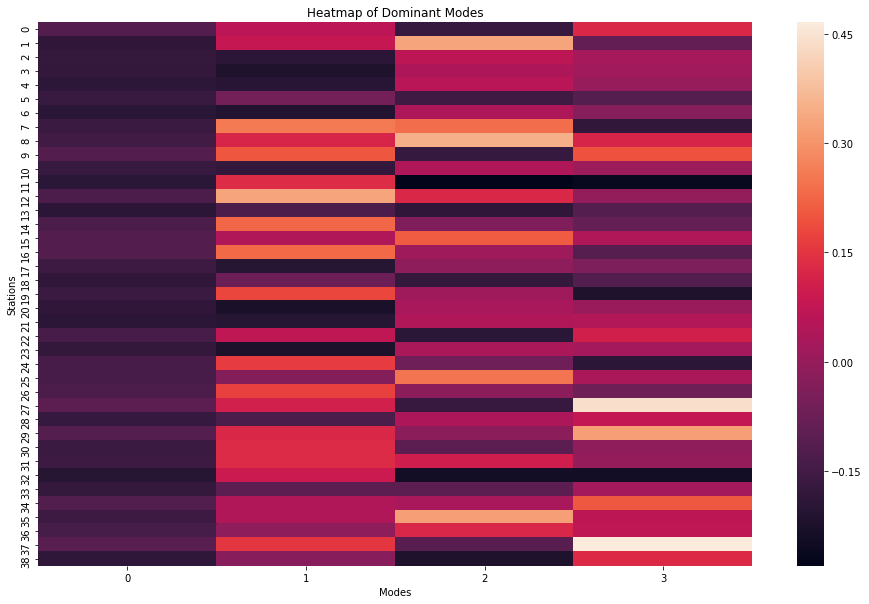

In [23]:
plt.figure(figsize=(16,10))
ax = sns.heatmap((results_dom_modes))
plt.xlabel("Modes")
plt.ylabel("Stations")
plt.title("Heatmap of Dominant Modes")

In [24]:
stations_data_dom_modes = []
for i in range(39):
    mode = []
    for j in range(4):
        set1 = []
        for k in range(len(stations_data[i][1])):
            set1.append(stations_data[i][1][k]*results_dom_modes[i][j])
        mode.append(set1)
    stations_data_dom_modes.append(mode)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


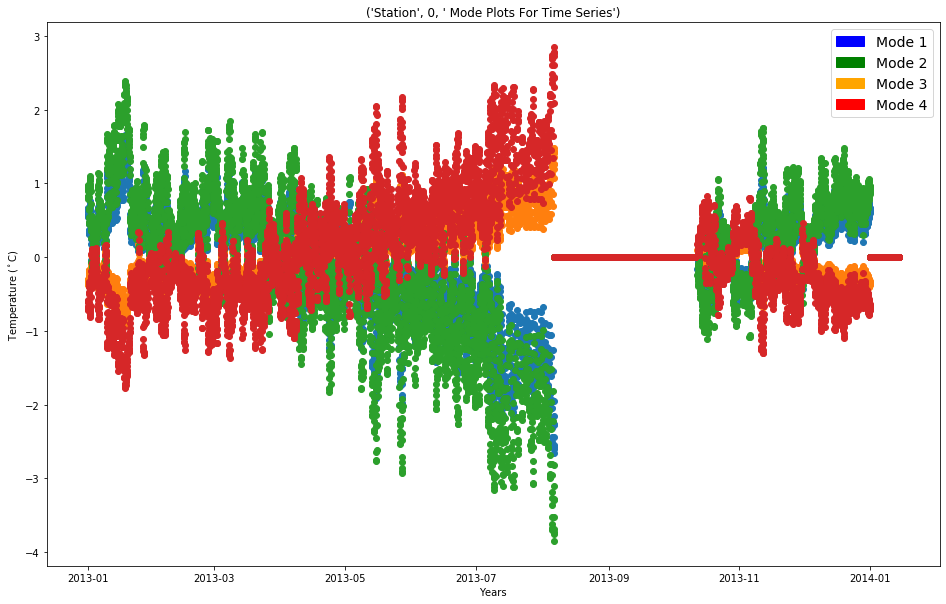

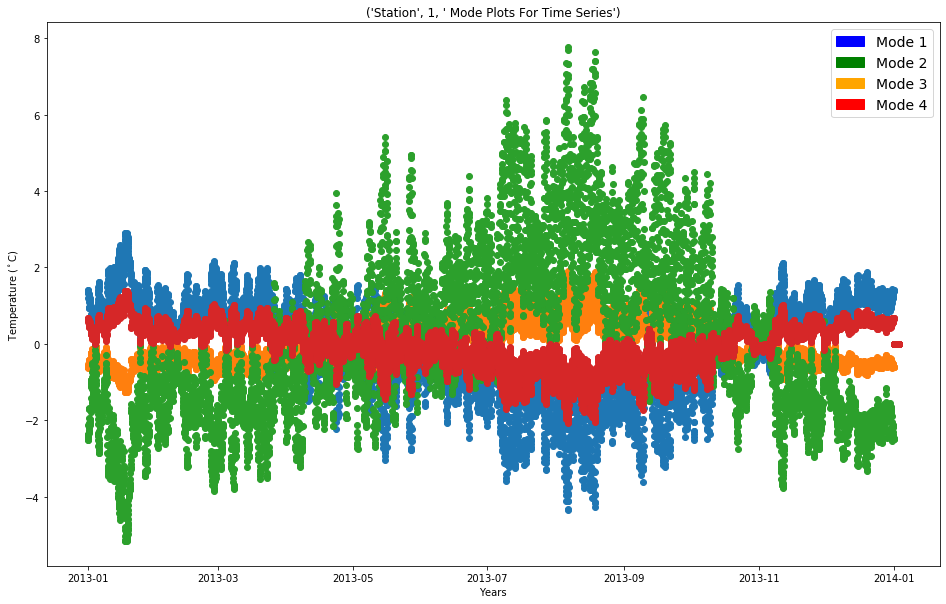

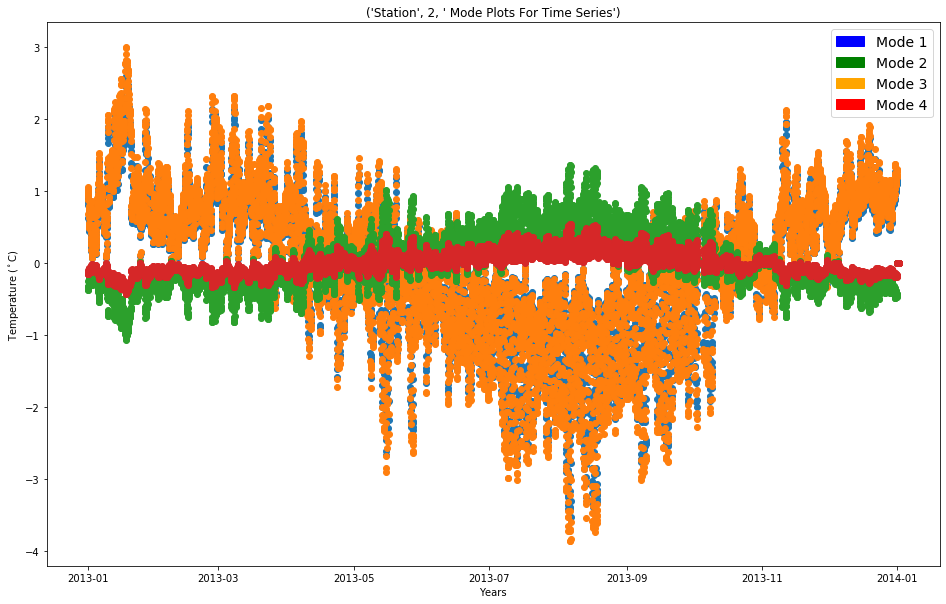

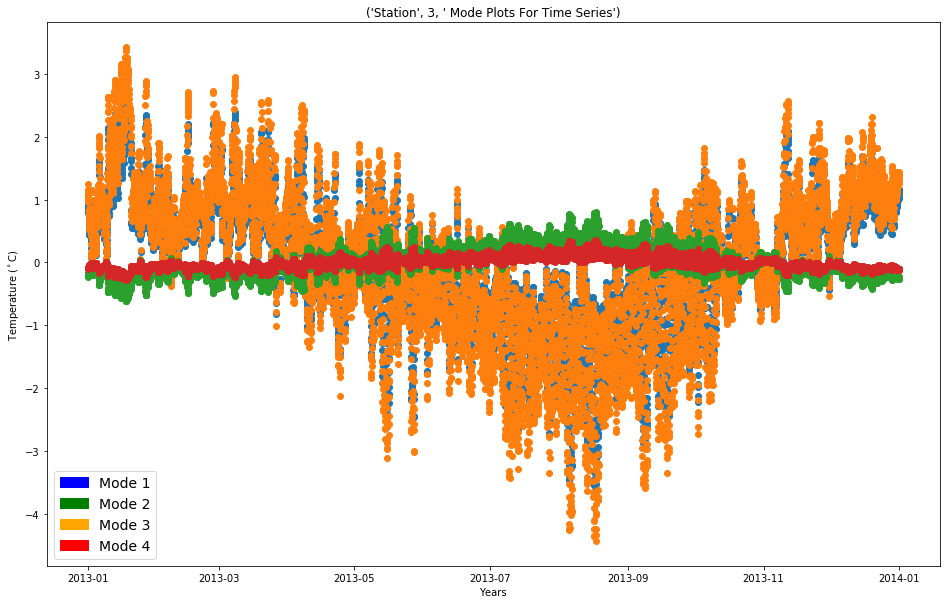

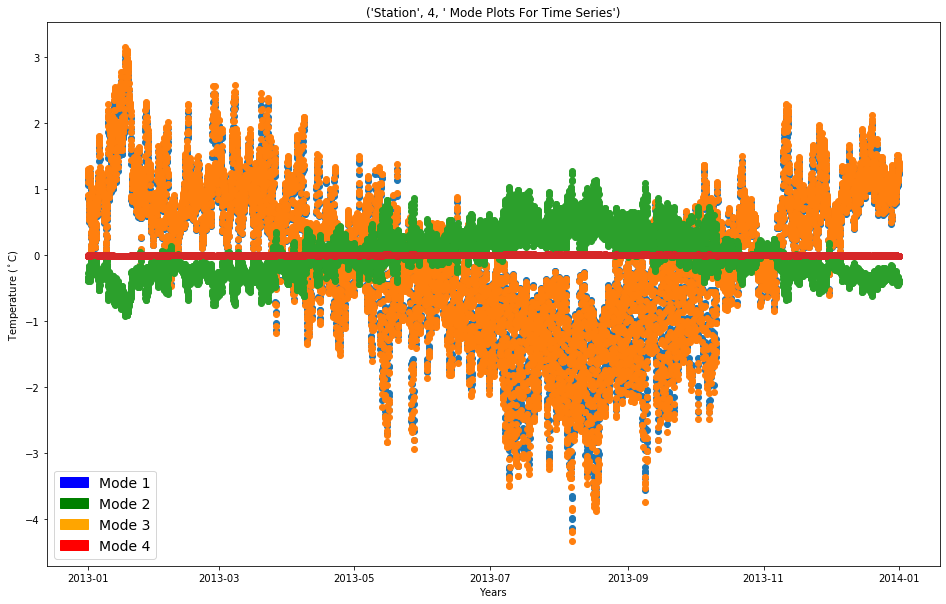

...

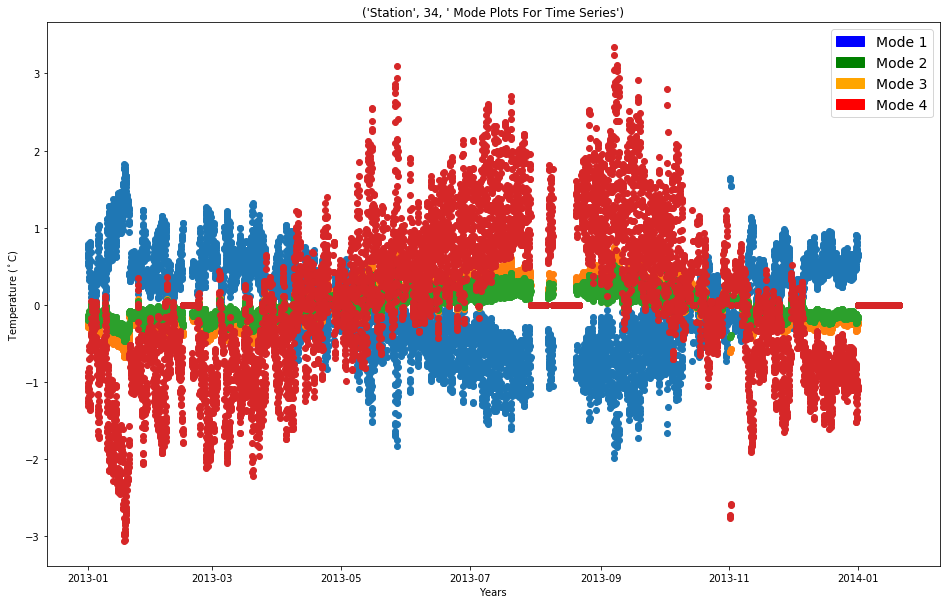

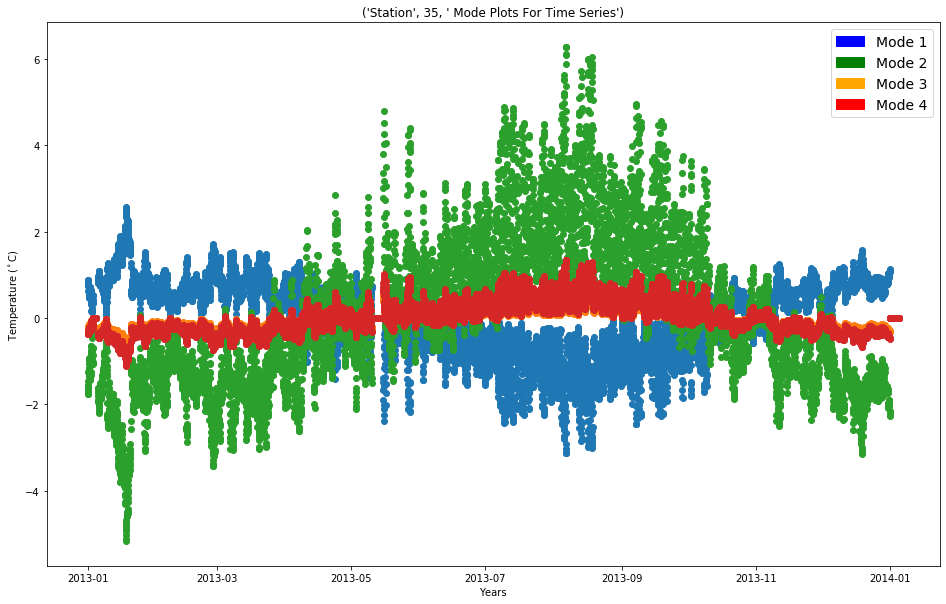

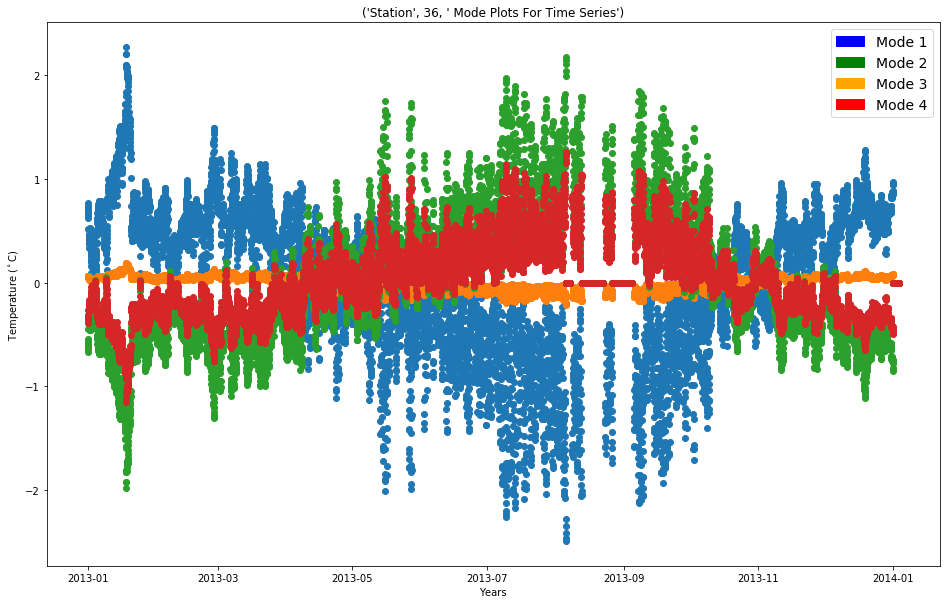

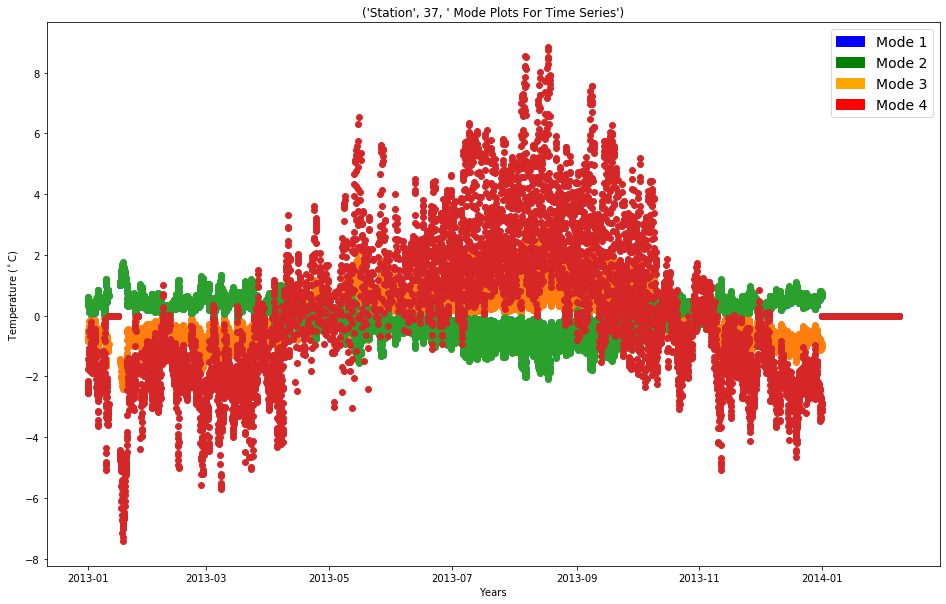

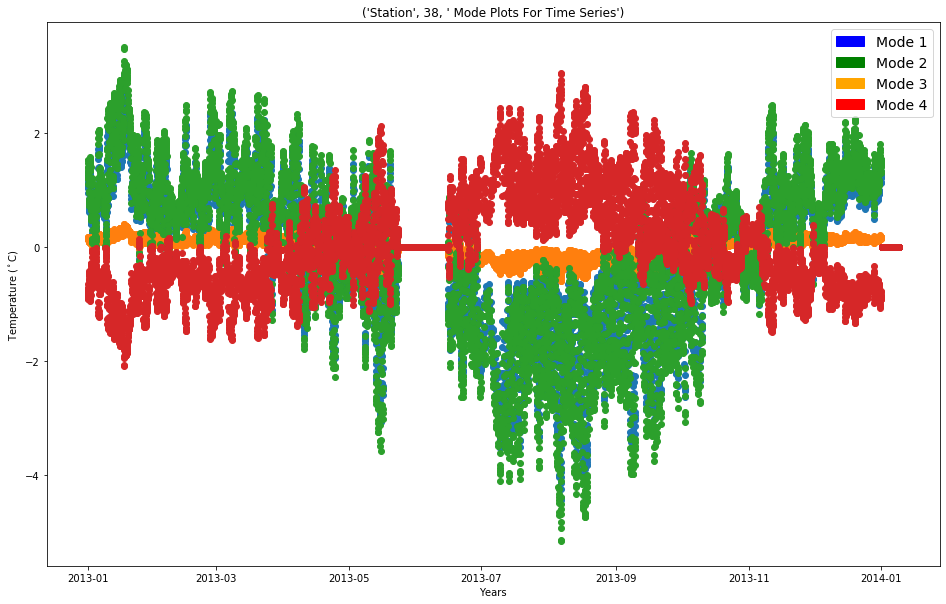

In [27]:
#for i in range(len(temps_data_hr)):
#pd.to_datetime(stations_data[i][0]-offset, unit='D')
import matplotlib.patches as mpatches
blue_patch = mpatches.Patch(color='blue', label='Mode 1')
green_patch = mpatches.Patch(color='green', label='Mode 2')
orange_patch = mpatches.Patch(color='orange', label='Mode 3')
red_patch = mpatches.Patch(color='red', label='Mode 4')

for i in range(0,39):
   # times = matplotlib.dates.date2num(stamps_hr[i])
    plt.figure(figsize=(16,10))
    plt.legend(handles=[blue_patch,green_patch,orange_patch,red_patch],prop={'size': 14})
    #plt.plot_date(stations_data[i][0], stations_data[i][1])
    plt.plot_date(stations_data[i][0], stations_data_dom_modes[i][0])
    plt.plot_date(stations_data[i][0], stations_data_dom_modes[i][1])
    plt.plot_date(stations_data[i][0], stations_data_dom_modes[i][2])
    plt.plot_date(stations_data[i][0], stations_data_dom_modes[i][3])

    plt.xlabel("Years")
    plt.ylabel("Temperature ($^\circ$C)")
    plt.title(("Station", i, " Mode Plots For Time Series"))